# Pregunta 1.2

### Denoising

In [5]:
from keras.datasets import mnist
import numpy as np
from keras.layers import Input, Dense
from keras.models import Model
from keras.utils import np_utils
from keras.optimizers import SGD
import matplotlib.pyplot as plt
from numpy.random import binomial
from numpy.random import standard_normal
from keras.models import load_model
from keras.models import model_from_json

In [6]:
def f(nval=1000):
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = x_train.astype('float32') / 255.
    x_test = x_test.astype('float32') / 255.
    x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
    x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
    x_val = x_train[-nval:]
    y_val = y_train[-nval:]
    x_train = x_train[:-nval]
    y_train = y_train[:-nval]
    Y_train = np_utils.to_categorical(y_train, 10)
    Y_val = np_utils.to_categorical(y_val, 10)
    Y_test = np_utils.to_categorical(y_test, 10)
    return (x_train, Y_train), (x_test, Y_test), (x_val, Y_val)

In [7]:
# Obtener conjuntos de datos
train, test, val = f()
x_train, Y_train = train
x_test, Y_test = test
x_val, Y_val = val

## a)

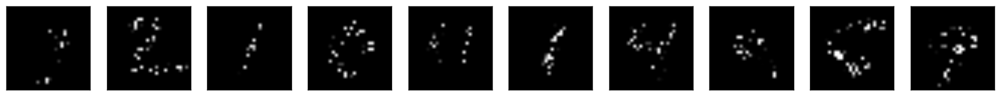

In [8]:
noise_level = 0.2
noise_mask = binomial(n=1,p=noise_level,size=x_train.shape)
noisy_x_train = x_train*noise_mask
noise_mask = binomial(n=1,p=noise_level,size=x_val.shape)
noisy_x_val = x_val*noise_mask
noise_mask = binomial(n=1,p=noise_level,size=x_test.shape)
noisy_x_test = x_test*noise_mask

n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(noisy_x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## b)

```python
noise_levels = [0.1,0.2,0.4,0.6,0.8,1.0]
i = 0

for noise_level in noise_levels:
    i += 1
    noise_mask = binomial(n=1,p=noise_level,size=x_train.shape)
    noisy_x_train = x_train*noise_mask
    noise_mask = binomial(n=1,p=noise_level,size=x_val.shape)
    noisy_x_val = x_val*noise_mask
    noise_mask = binomial(n=1,p=noise_level,size=x_test.shape)
    noisy_x_test = x_test*noise_mask

    input_img = Input(shape=(784,))
    encoded = Dense(32, activation='sigmoid')(input_img)
    decoded = Dense(784, activation='sigmoid')(encoded)
    autoencoder = Model(input=input_img, output=decoded)
    encoder = Model(input=input_img, output=encoded)
    encoded_input = Input(shape=(32,))
    decoder_layer = autoencoder.layers[-1]
    decoder = Model(input=encoded_input, output=decoder_layer(encoded_input))
    autoencoder.compile(optimizer=SGD(lr=1.0), loss='binary_crossentropy')
    autoencoder.fit(noisy_x_train,x_train,nb_epoch=50,batch_size=25,shuffle=True, validation_data=(noisy_x_val, x_val))
    autoencoder.save("autoencoder"+str(i)+".h5")
    encoder.save("encoder"+str(i)+".h5")
    decoder.save("decoder"+str(i)+".h5")
    # Se ejecuta en servidor con GPU
```

In [6]:
# Se carga el output obtenido para mostrarlo
text_file = open('1_2/output', 'r')

output = text_file.read()

print output

Train on 59000 samples, validate on 1000 samples
Epoch 1/50
59000/59000 [==============================] - 1s - loss: 0.3098 - val_loss: 0.2772
Epoch 2/50
59000/59000 [==============================] - 1s - loss: 0.2658 - val_loss: 0.2741
Epoch 3/50
59000/59000 [==============================] - 1s - loss: 0.2643 - val_loss: 0.2733
Epoch 4/50
59000/59000 [==============================] - 1s - loss: 0.2637 - val_loss: 0.2729
Epoch 5/50
59000/59000 [==============================] - 1s - loss: 0.2633 - val_loss: 0.2728
Epoch 6/50
59000/59000 [==============================] - 1s - loss: 0.2631 - val_loss: 0.2724
Epoch 7/50
59000/59000 [==============================] - 1s - loss: 0.2628 - val_loss: 0.2721
Epoch 8/50
59000/59000 [==============================] - 1s - loss: 0.2626 - val_loss: 0.2719
Epoch 9/50
59000/59000 [==============================] - 1s - loss: 0.2624 - val_loss: 0.2716
Epoch 10/50
59000/59000 [==============================] - 1s - loss: 0.2620 - val_loss: 0.2713


/usr/lib/python2.7/site-packages/keras/models.py:136: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Nivel de Ruido:  0.1
Imagenes Corruptas:


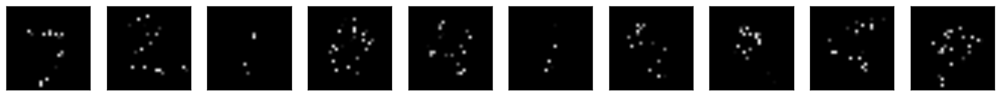

Imagenes Reconstruidas:


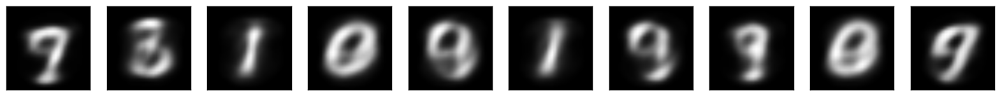

Nivel de Ruido:  0.2
Imagenes Corruptas:


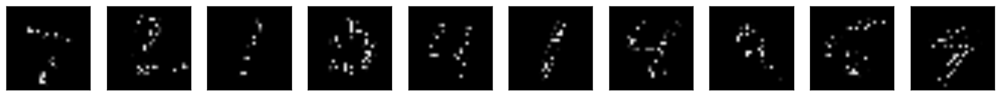

Imagenes Reconstruidas:


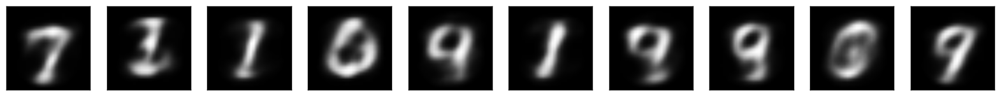

Nivel de Ruido:  0.4
Imagenes Corruptas:


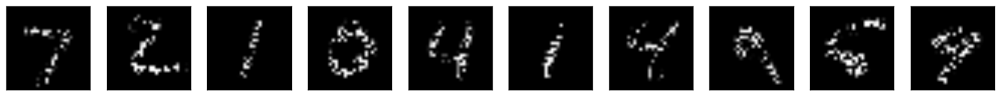

Imagenes Reconstruidas:


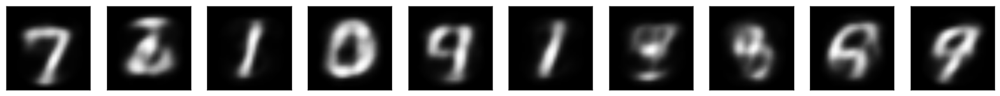

Nivel de Ruido:  0.6
Imagenes Corruptas:


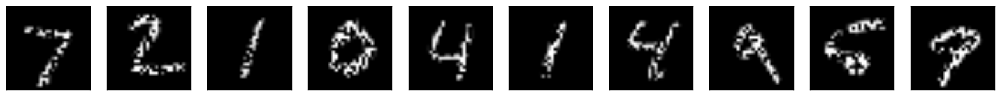

Imagenes Reconstruidas:


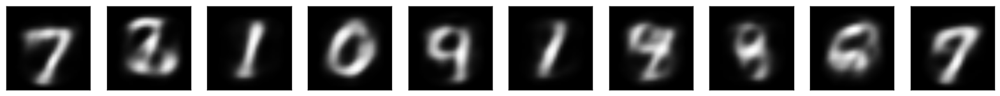

Nivel de Ruido:  0.8
Imagenes Corruptas:


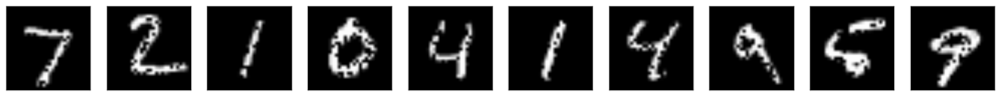

Imagenes Reconstruidas:


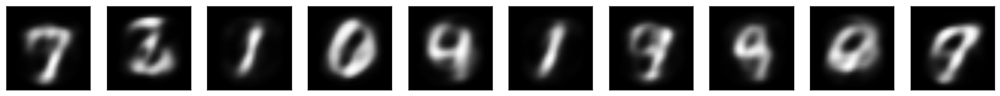

Nivel de Ruido:  1.0
Imagenes Corruptas:


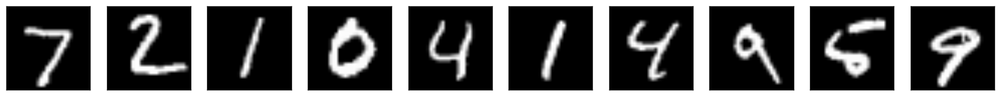

Imagenes Reconstruidas:


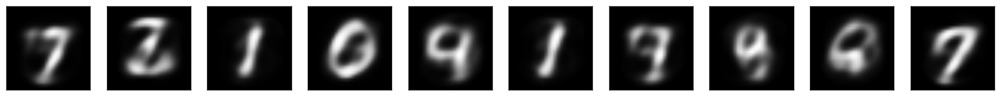

In [7]:
noise_levels = [0.1,0.2,0.4,0.6,0.8,1.0]

for i in range(len(noise_levels)):
    noise_level = noise_levels[i]

    # Se carga el encoder y decoder obtenido para noise_level 0,1
    encoder = load_model('1_2/encoder'+str(i+1)+'.h5')
    decoder = load_model('1_2/decoder'+str(i+1)+'.h5')

    print "Nivel de Ruido: ", noise_level

    # Se corrompe la imagen a mostrar

    noise_mask = binomial(n=1,p=noise_level,size=x_test.shape)
    noisy_x_test = x_test*noise_mask

    # Visualización postdenoising
    n = 10

    # Se muestra la imagen corrupta
    print "Imagenes Corruptas:"
    plt.figure(figsize=(20, 2))
    for i in range(n):
        ax = plt.subplot(1, n, i+1)
        plt.imshow(noisy_x_test[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    # Se muestra la imagen reconstruida
    print "Imagenes Reconstruidas:"
    plt.figure(figsize=(20, 2))
    for i in range(n):
        ax = plt.subplot(1, n, i+1)
        encoded = encoder.predict(noisy_x_test[i].reshape(1,784))
        decoded = decoder.predict(encoded)
        plt.imshow(decoded.reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

## c)

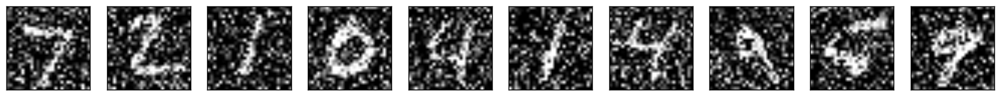

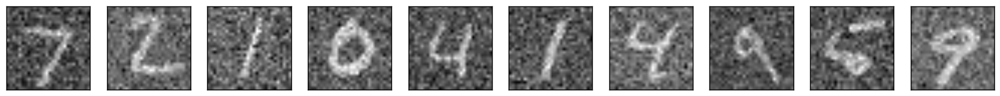

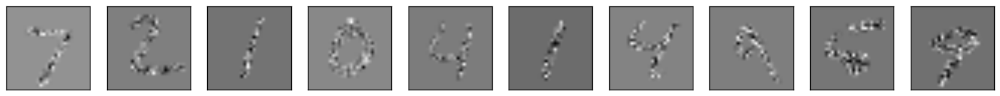

In [8]:
noise_factor = 0.5

noisy_x_train = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape) 
noisy_x_test = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 

noisy_x_train = np.clip(noisy_x_train, 0., 1.)
noisy_x_test = np.clip(noisy_x_test, 0., 1.)

n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(noisy_x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

devst = 0.3
noise_mask = np.random.normal(devst,size=x_train.shape)
noisy_x_train = x_train + noise_mask
noise_mask = devst*standard_normal(size=x_val.shape)
noisy_x_val = x_val + noise_mask
noise_mask = devst*standard_normal(size=x_test.shape)
noisy_x_test = x_test + noise_mask

n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(noisy_x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

devst = 0.5
noise_mask = devst*standard_normal(size=x_train.shape)
noisy_x_train = x_train*noise_mask
noise_mask = devst*standard_normal(size=x_val.shape)
noisy_x_val = x_val*noise_mask
noise_mask = devst*standard_normal(size=x_test.shape)
noisy_x_test = x_test*noise_mask

n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(noisy_x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## d)

```python
devsts = [0.1,0.3,0.5,0.7,0.9,1.0]
i = 0

for devsts in devsts:
    i += 1
    noise_mask = devst*standard_normal(size=x_train.shape)
    noisy_x_train = x_train*noise_mask
    noise_mask = devst*standard_normal(size=x_val.shape)
    noisy_x_val = x_val*noise_mask
    noise_mask = devst*standard_normal(size=x_test.shape)
    noisy_x_test = x_test*noise_mask

    input_img = Input(shape=(784,))
    encoded = Dense(32, activation='sigmoid')(input_img)
    decoded = Dense(784, activation='sigmoid')(encoded)
    autoencoder = Model(input=input_img, output=decoded)
    encoder = Model(input=input_img, output=encoded)
    encoded_input = Input(shape=(32,))
    decoder_layer = autoencoder.layers[-1]
    decoder = Model(input=encoded_input, output=decoder_layer(encoded_input))
    autoencoder.compile(optimizer=SGD(lr=1.0), loss='binary_crossentropy')
    autoencoder.fit(noisy_x_train,x_train,nb_epoch=50,batch_size=25,shuffle=True, validation_data=(noisy_x_val, x_val))
    autoencoder.save("autoencoder_2_"+str(i)+".h5")
    encoder.save("encoder_2_"+str(i)+".h5")
    decoder.save("decoder_2_"+str(i)+".h5")
    
```

In [1]:
# Se carga el output obtenido para mostrarlo
text_file = open('1_2/outputd', 'r')

output = text_file.read()

print output

Train on 59000 samples, validate on 1000 samples
Epoch 1/50
59000/59000 [==============================] - 1s - loss: 0.3117 - val_loss: 0.2771
Epoch 2/50
59000/59000 [==============================] - 1s - loss: 0.2657 - val_loss: 0.2740
Epoch 3/50
59000/59000 [==============================] - 1s - loss: 0.2642 - val_loss: 0.2731
Epoch 4/50
59000/59000 [==============================] - 1s - loss: 0.2636 - val_loss: 0.2728
Epoch 5/50
59000/59000 [==============================] - 1s - loss: 0.2634 - val_loss: 0.2727
Epoch 6/50
59000/59000 [==============================] - 1s - loss: 0.2632 - val_loss: 0.2726
Epoch 7/50
59000/59000 [==============================] - 1s - loss: 0.2631 - val_loss: 0.2725
Epoch 8/50
59000/59000 [==============================] - 1s - loss: 0.2630 - val_loss: 0.2725
Epoch 9/50
59000/59000 [==============================] - 1s - loss: 0.2630 - val_loss: 0.2725
Epoch 10/50
59000/59000 [==============================] - 1s - loss: 0.2629 - val_loss: 0.2724


In [4]:
devsts = [0.1,0.3,0.5,0.7,0.9,1.0]

for i in range(len(devsts)):
    devst = devsts[i]

    # Se carga el encoder y decoder obtenido para noise_level 0,1
    encoder = load_model('1_2/encoder_2_'+str(i+1)+'.h5')
    decoder = load_model('1_2/decoder_2_'+str(i+1)+'.h5')

    print "Desviación Estándar: ", devst

    # Se corrompe la imagen a mostrar

    noise_mask = devst*standard_normal(size=x_train.shape)
    noisy_x_train = x_train*noise_mask
    noise_mask = devst*standard_normal(size=x_val.shape)
    noisy_x_val = x_val*noise_mask
    noise_mask = devst*standard_normal(size=x_test.shape)
    noisy_x_test = x_test*noise_mask

    # Visualización postdenoising
    n = 10

    # Se muestra la imagen corrupta
    print "Imagenes Corruptas:"
    plt.figure(figsize=(20, 2))
    for i in range(n):
        ax = plt.subplot(1, n, i+1)
        plt.imshow(noisy_x_test[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    # Se muestra la imagen reconstruida
    print "Imagenes Reconstruidas:"
    plt.figure(figsize=(20, 2))
    for i in range(n):
        ax = plt.subplot(1, n, i+1)
        encoded = encoder.predict(noisy_x_test[i].reshape(1,784))
        decoded = decoder.predict(encoded)
        plt.imshow(decoded.reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

Desviación Estándar:  0.1


/usr/lib/python2.7/site-packages/keras/models.py:136: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


NameError: name 'x_train' is not defined

## e)

In [18]:
from keras import backend as K
import theano
#Cargar modelo

json_file = open('1_2/model1.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("1_2/model1.h5")
#model.compile(optimizer=SGD(lr=1.0), loss='binary_crossentropy')

#Obtener los pesos
inputs = [K.learning_phase()] + model.inputs

_convout1_f = K.function(inputs, [encoder.output])
def convout1_f(X):
    # The [0] is to disable the training phase flag
    return _convout1_f([0] + [X])

W = model.layers[0].W.get_value(borrow=True)
print("W shape : ", W.shape)
W = np.squeeze(W)
W = W[:,0,:,:]

pl.figure(figsize=(10, 10))
pl.title('conv1 weights')
nice_imshow(pl.gca(), make_mosaic(W, 4, 4), cmap=cm.binary)
plt.show()

AttributeError: 'InputLayer' object has no attribute 'W'

## f)